In [1]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns
sns.set_theme(style='whitegrid')
import matplotlib.cm as cm

import textwrap
from matplotlib.backends.backend_pdf import PdfPages

import matplotlib.colors as mcolors
import matplotlib.cm as cm
from matplotlib.patches import Patch
import matplotlib as mpl

import textalloc as ta
from adjustText import adjust_text

%load_ext autoreload
%autoreload 2

In [7]:
mpl.rcParams["font.sans-serif"] = [
    "SF Pro Text",
    "Tahoma",
    "Arial",
    "DejaVu Sans",
    "Liberation Sans",
    "Bitstream Vera Sans",
    "sans-serif",
]

In [8]:
with open("qual-o-mat-data/data/2024/europa/opinion.json") as f:
    opinion = json.load(f)
opinion = pd.DataFrame(opinion)
opinion = opinion.set_index("id")
opinion = opinion.pivot_table(index="party", columns="statement", values="answer", aggfunc="first")
# delete party 16
opinion = opinion.drop(16)
# replace values that are 2 with 0.5
opinion = opinion.replace(2, 0.5)
opinion = -(opinion * 2 - 1)
opinion

statement,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
party,,,,,,,,,,,,,,,,,,,,,
0,-1.0,1,-1,1.0,-1.0,-1.0,-1.0,1.0,-1,1.0,...,-1.0,1.0,1.0,1.0,1,-1.0,1.0,1.0,1.0,1.0
1,1.0,-1,1,1.0,1.0,-1.0,1.0,-1.0,1,1.0,...,-1.0,1.0,-1.0,1.0,1,-1.0,1.0,-1.0,1.0,1.0
2,-1.0,-1,1,1.0,-1.0,-1.0,1.0,-0.0,-1,1.0,...,-1.0,1.0,-1.0,1.0,1,-1.0,1.0,1.0,1.0,1.0
3,-1.0,1,-1,-1.0,-1.0,1.0,-1.0,1.0,-1,-1.0,...,1.0,-0.0,1.0,-1.0,1,1.0,-1.0,1.0,-1.0,-1.0
4,1.0,-1,1,-1.0,1.0,-1.0,1.0,-1.0,1,-1.0,...,-1.0,1.0,-1.0,1.0,1,1.0,1.0,-1.0,-1.0,1.0
5,-1.0,1,1,1.0,-1.0,-1.0,1.0,1.0,-1,1.0,...,-1.0,1.0,1.0,1.0,1,-1.0,-0.0,1.0,1.0,1.0
6,-1.0,-1,1,-0.0,1.0,-1.0,1.0,-1.0,1,1.0,...,-1.0,1.0,-1.0,1.0,1,1.0,1.0,-1.0,-1.0,1.0
7,1.0,1,1,1.0,-0.0,-1.0,1.0,1.0,-1,1.0,...,-1.0,1.0,-1.0,1.0,1,-1.0,1.0,1.0,1.0,1.0
8,1.0,-1,1,1.0,1.0,-1.0,1.0,-1.0,1,1.0,...,-1.0,1.0,-1.0,1.0,1,1.0,1.0,-1.0,1.0,1.0


In [9]:
with open("qual-o-mat-data/data/2024/europa/party.json") as f:
    party = json.load(f)
party = pd.DataFrame(party)
party.set_index("id", inplace=True)
party

,name,longname
id,,
0,CDU / CSU,Christlich Demokratische Union Deutschlands / ...
1,GRÜNE,BÜNDNIS 90/DIE GRÜNEN
2,SPD,Sozialdemokratische Partei Deutschlands
3,AfD,Alternative für Deutschland
4,DIE LINKE,DIE LINKE
5,FDP,Freie Demokratische Partei
6,Die PARTEI,"Partei für Arbeit, Rechtsstaat, Tierschutz, El..."
7,FREIE WÄHLER,FREIE WÄHLER
8,Tierschutzpartei,PARTEI MENSCH UMWELT TIERSCHUTZ


In [10]:
with open("qual-o-mat-data/data/2024/europa/statement.json") as f:
    statement = json.load(f)
statement = pd.DataFrame(statement)
statement.set_index("id", inplace=True)
statement

,category,label,text
id,,,
0,None,EU-Steuern,Die EU soll eigene Steuern erheben dürfen.
1,None,Verbrennungsmotoren,Fahrzeuge mit Verbrennungsmotoren sollen auch ...
2,None,Seenotrettung,Die EU soll eine eigene Seenotrettung im Mitte...
3,None,EU-Mitgliedschaft der Ukraine,Die Ukraine soll Mitglied der EU werden.
4,None,Ökologische Landwirtschaft,Die EU soll vorrangig ökologische Landwirtscha...
5,None,Nationale Währung,In Deutschland soll der Euro durch eine nation...
6,None,Geschlechtsidentität im Pass,"Die EU soll den Mitgliedstaaten empfehlen, auß..."
7,None,Jagd auf Wölfe,Die Jagd auf Wölfe soll in Regionen erlaubt se...
8,None,Photovoltaik für Wohngebäude,Beim Bau neuer Wohngebäude in der EU soll die ...


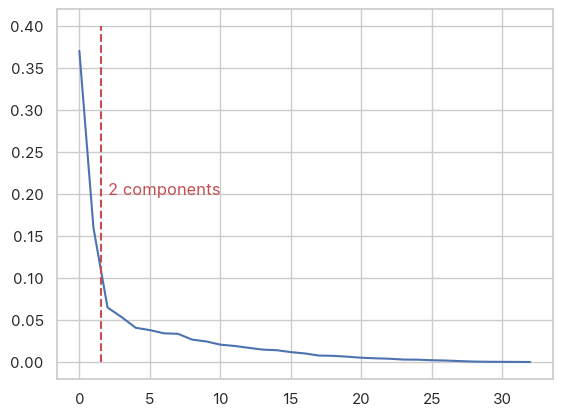

[[0.29803922 0.44705882 0.69019608 1.        ]]


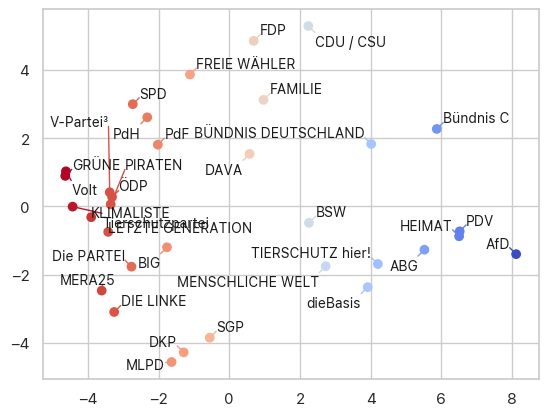

In [11]:
# opinion pca
scaler = StandardScaler()
opinion_scaled = scaler.fit_transform(opinion)
pca = PCA()
opinion_pca = pca.fit_transform(opinion_scaled)
opinion_pca = pd.DataFrame(opinion_pca) #, columns=[0, 1])
afd = party[party.name == "AfD"].index[0]
linke = party[party.name == "DIE LINKE"].index[0]
if opinion_pca[0][afd] < opinion_pca[0][linke]:
    opinion_pca[0] = -opinion_pca[0]


# plot eigenvalues
plt.plot(pca.explained_variance_ratio_)
plt.vlines(1.5, 0, 0.4, colors='r', linestyles='dashed')
plt.text(2, 0.2, '2 components', color='r')
plt.show()

fig, ax = plt.subplots()
# texts = [plt.text(opinion_pca[0][i], opinion_pca[1][i], ) for i, txt in enumerate(opinion.index)]
# adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray'))

texts = [party.name[txt] for txt in opinion.index]
path = ax.scatter(opinion_pca[0], opinion_pca[1], c=opinion_pca[0], cmap="coolwarm_r")
print(path.get_facecolors())

# get color for each point as array
cmap = mpl.colormaps['coolwarm_r']
colors = opinion_pca[0]
norm = mcolors.Normalize(vmin=colors.min(), vmax=colors.max())
colors = cmap(norm(colors))

ta.allocate(ax,opinion_pca[0], opinion_pca[1],
            texts,
            x_scatter=opinion_pca[0], y_scatter=opinion_pca[1],
            # textsize=10,
            linecolor=colors,
            # linecolor=[colors[i%4] for i in range(len(opinion_pca[0]))],
            avoid_label_lines_overlap=True,
            )
plt.show(fig)

/var/folders/rc/yt1p624x707cdwbwc_7fchq40000gn/T/ipykernel_83412/945952929.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(sorted_labels, rotation=0)  # Adjusted y-axis labels


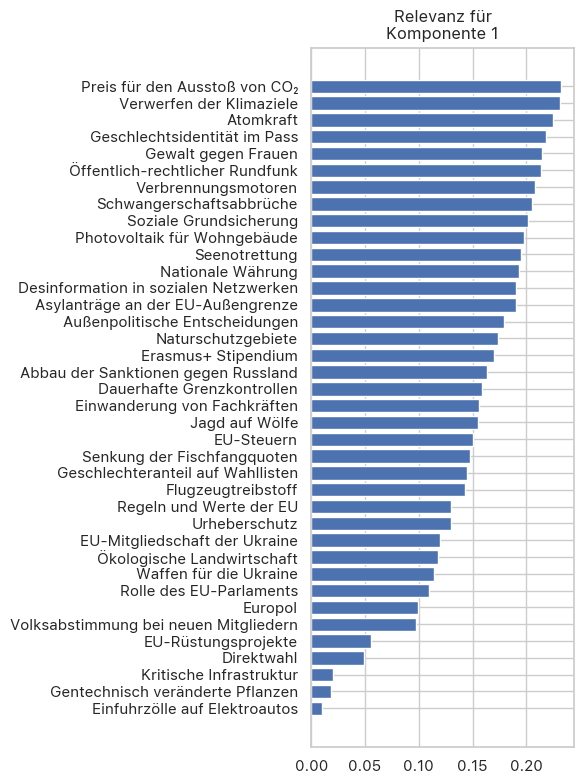

/var/folders/rc/yt1p624x707cdwbwc_7fchq40000gn/T/ipykernel_83412/945952929.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(sorted_labels, rotation=0)  # Adjusted y-axis labels


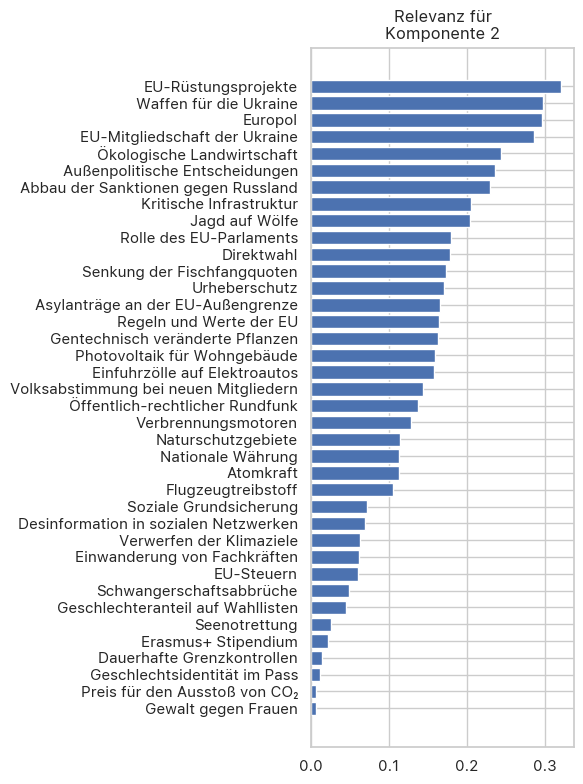

/var/folders/rc/yt1p624x707cdwbwc_7fchq40000gn/T/ipykernel_83412/945952929.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(sorted_labels, rotation=0)  # Adjusted y-axis labels


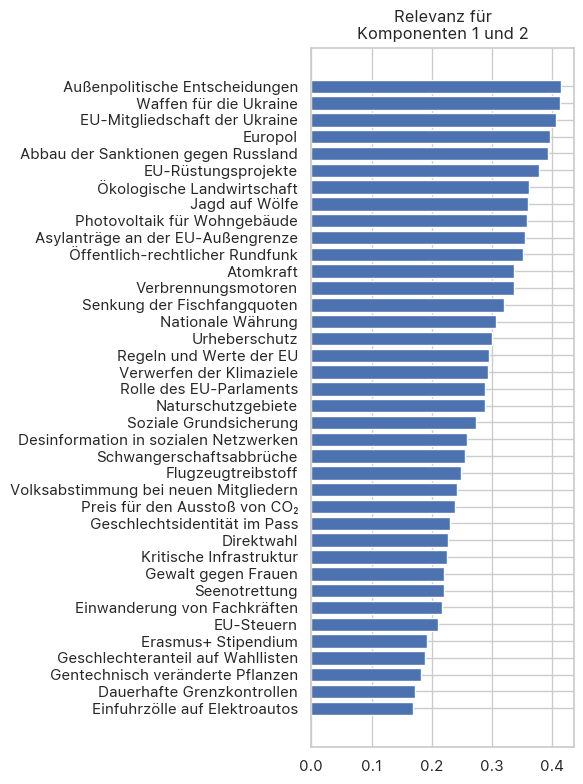

In [12]:
def plot_relevance(pca, n):
    fig, ax = plt.subplots(figsize=(6, 8), tight_layout=True)
    if isinstance(n, list):
        relevance = np.sum(np.abs(pca.components_[n]), axis=0)
        n = [str(i + 1) for i in n]
        ax.set_title(f"Relevanz für\nKomponenten {', '.join(n[:-1])} und {n[-1]}")
    else:
        relevance = np.abs(pca.components_[n])
        ax.set_title(f"Relevanz für\nKomponente {n + 1}")
    sorted_indices = np.argsort(relevance)
    sorted_labels = statement.label[sorted_indices]
    sorted_values = relevance[sorted_indices]
    ax.barh(sorted_labels, sorted_values)  # Switched to horizontal bar chart
    ax.set_yticklabels(sorted_labels, rotation=0)  # Adjusted y-axis labels
    return fig

plt.show(plot_relevance(pca, 0))
plt.show(plot_relevance(pca, 1))
plt.show(plot_relevance(pca, [0, 1]))

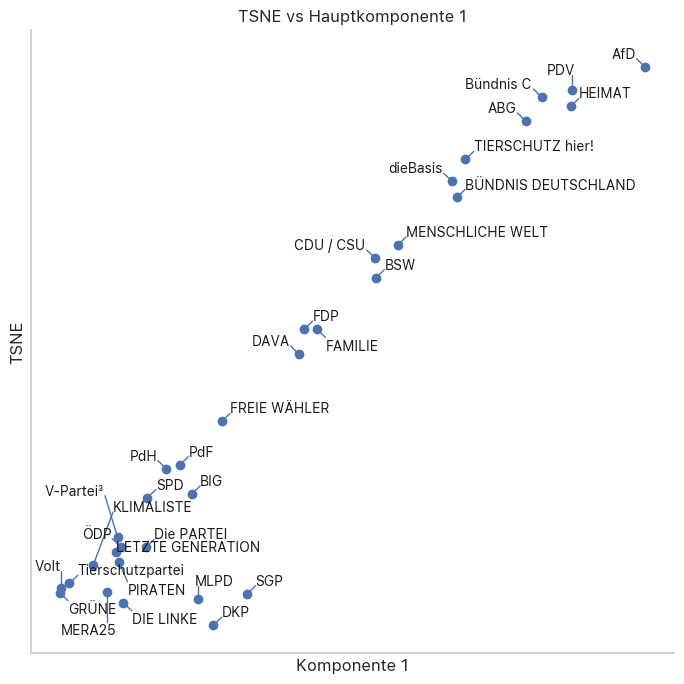

In [13]:
# project opinion to 1d tsne

from sklearn.manifold import TSNE

tsne = TSNE(n_components=1)
opinion_tsne_1 = tsne.fit_transform(opinion_scaled)
opinion_tsne_1 = pd.DataFrame(opinion_tsne_1, columns=["TSNE"])
opinion_tsne_1["party"] = opinion.index
if opinion_tsne_1["TSNE"][afd] < opinion_tsne_1["TSNE"][linke]:
    opinion_tsne_1["TSNE"] = -opinion_tsne_1["TSNE"]

def pca_vs_tsne(pca, tsne):
    fig, ax = plt.subplots(figsize=(7, 7), tight_layout=True)
    ax.scatter(pca[0], tsne["TSNE"])
    # texts = [plt.text(pca[0][i], tsne["TSNE"][i], party.name[txt], ha="center", va="center") for i, txt in enumerate(opinion.index)]
    # adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray'))
    texts = [party.name[txt] for txt in opinion.index]
    ta.allocate(ax, pca[0], tsne["TSNE"], texts, x_scatter=pca[0], y_scatter=tsne["TSNE"], avoid_label_lines_overlap=True, linecolor='b')
    # axes labels
    ax.set_title("TSNE vs Hauptkomponente 1")
    ax.set_xlabel("Komponente 1")
    ax.set_ylabel("TSNE")
    
    # remove spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    return fig

plt.show(pca_vs_tsne(opinion_pca, opinion_tsne_1))
# fig, ax = plt.subplots(figsize=(7, 7))
# ax.scatter(opinion_pca[0], opinion_tsne_1["TSNE"], c=opinion_pca[0])
# texts = [plt.text(opinion_pca[0][i], opinion_tsne_1["TSNE"][i], party.name[txt]) for i, txt in enumerate(opinion.index)]
# adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray'))
# # axes labels
# ax.set_xlabel("PCA1")
# ax.set_ylabel("TSNE")
# plt.show()

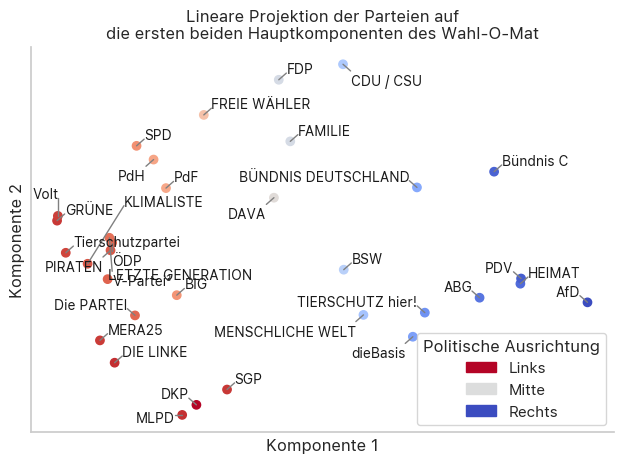

In [14]:
def plot_opinion_2d(opinion_pca, opinion_tsne_1, party):
    fig, ax = plt.subplots(tight_layout=True)
    cmap = mpl.colormaps["coolwarm_r"]
    norm = mpl.colors.Normalize(vmin=-1, vmax=1)
    ax.scatter(opinion_pca[0], opinion_pca[1], c=opinion_tsne_1["TSNE"], cmap=cmap)
    # legend for color
    left_patch = Patch(color=cmap(norm(-1)), label='Links')
    center_patch = Patch(color=cmap(norm(0)), label='Mitte')
    right_patch = Patch(color=cmap(norm(1)), label='Rechts')
    legend = ax.legend(handles=[left_patch, center_patch, right_patch], title='Politische Ausrichtung')


    ax.set_title("Lineare Projektion der Parteien auf\ndie ersten beiden Hauptkomponenten des Wahl-O-Mat")
    ax.set_xlabel("Komponente 1")
    ax.set_ylabel("Komponente 2")
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])

    # no borders
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    # ax.spines['left'].set_visible(False)
    # ax.spines['bottom'].set_visible(False)
    
    texts = [party.name[txt] for txt in opinion.index]
    ta.allocate(ax, opinion_pca[0], opinion_pca[1], texts, x_scatter=opinion_pca[0], y_scatter=opinion_pca[1], avoid_label_lines_overlap=True, linecolor="gray")
    return fig
plt.show(plot_opinion_2d(opinion_pca, opinion_tsne_1, party))

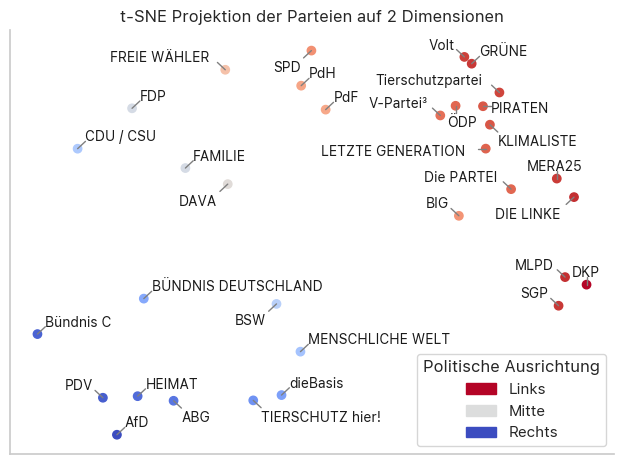

In [15]:
# project opinion using tsne
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
opinion_tsne_2 = tsne.fit_transform(opinion_scaled)
opinion_tsne_2 = pd.DataFrame(opinion_tsne_2, columns=["t-SNE1", "t-SNE2"])

def plot_tsne2(opinion_tsne_2):
    fig, ax = plt.subplots(tight_layout=True)
    
    cmap = mpl.colormaps["coolwarm_r"]
    norm = mpl.colors.Normalize(vmin=-1, vmax=1)
    left_patch = Patch(color=cmap(norm(-1)), label='Links')
    center_patch = Patch(color=cmap(norm(0)), label='Mitte')
    right_patch = Patch(color=cmap(norm(1)), label='Rechts')
    
    ax.scatter(opinion_tsne_2["t-SNE1"], opinion_tsne_2["t-SNE2"], c=opinion_tsne_1["TSNE"], cmap=cmap)
    # texts = [plt.text(opinion_tsne_2["t-SNE1"][i], opinion_tsne_2["t-SNE2"][i], party.name[txt]) for i, txt in enumerate(opinion.index)]
    # adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray'))
    texts = [party.name[txt] for txt in opinion.index]
    ta.allocate(ax, opinion_tsne_2["t-SNE1"], opinion_tsne_2["t-SNE2"], texts, x_scatter=opinion_tsne_2["t-SNE1"], y_scatter=opinion_tsne_2["t-SNE2"], avoid_label_lines_overlap=True, linecolor="gray")
    ax.grid(False)
    # no borders
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    # ax.spines['left'].set_visible(False)
    # ax.spines['bottom'].set_visible(False)

    ax.set_xticks([])
    ax.set_yticks([])
    
    ax.set_title("t-SNE Projektion der Parteien auf 2 Dimensionen")
    
    legend = ax.legend(handles=[left_patch, center_patch, right_patch], title='Politische Ausrichtung')


    return fig

plt.show(plot_tsne2(opinion_tsne_2))

In [16]:
# 3d tsne plot with plotly
import plotly.express as px

tsne = TSNE(n_components=3)
opinion_tsne_3 = tsne.fit_transform(opinion_scaled)
opinion_tsne_3 = pd.DataFrame(opinion_tsne_3, columns=["t-SNE1", "t-SNE2", "t-SNE3"])
opinion_tsne_3["party"] = party.name

fig = px.scatter_3d(opinion_tsne_3, x="t-SNE1", y="t-SNE2", z="t-SNE3", color=opinion_tsne_1["TSNE"],
                        text=opinion_tsne_3["party"])
fig.update_traces(textposition='top center')


In [18]:
# get AfD and DIE LINKE from party to set left/right orientation

def opinion_vs_spectrum(opinion, spectrum, ylabel, yticks, color=None):
    fig_list = []
    for o in opinion.columns:
        fig, ax = plt.subplots(figsize=(6, 7), tight_layout=True)
        x, y = opinion[o].values, spectrum
        if color is None:
            ax.scatter(x, y)
        else:
            cmap = mpl.colormaps["coolwarm_r"]
            norm = mcolors.Normalize(vmin=-1, vmax=1)
            ax.scatter(x, y, c=color, cmap=cmap)
            left_patch = Patch(color=cmap(norm(-1)), label='Links')
            center_patch = Patch(color=cmap(norm(0)), label='Mitte')
            right_patch = Patch(color=cmap(norm(1)), label='Rechts')
            legend = ax.legend(handles=[left_patch, center_patch, right_patch], title='Politische Ausrichtung')
        texts = [plt.text(x[i], y[i], party.name[txt], ha='center', va='center') for i, txt in enumerate(opinion.index)]
        adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray'))
        # texts = [party.name[txt] for txt in opinion.index]
        # ta.allocate(ax, x, y, texts, x_scatter=x, y_scatter=y, avoid_label_lines_overlap=True, linecolor='gray')
        ax.set_title('\n'.join(textwrap.wrap(statement.loc[o].text, width=50)))
        ax.set_xticks([-1, 0, 1])
        ax.set_xticklabels(["Stimme nicht zu", "Neutral", "Stimme zu"])
        ax.set_yticks([y.min(), y.max()])
        ax.set_yticklabels(yticks)
        ax.grid(False)
        ax.set_ylabel(ylabel)
        plt.show()
        fig_list.append(fig)
    return fig_list

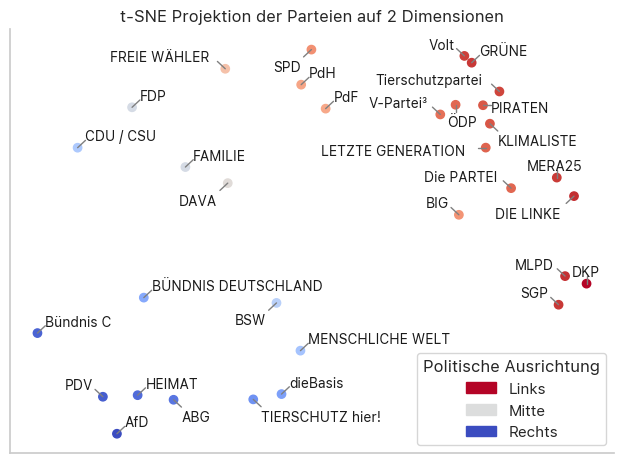

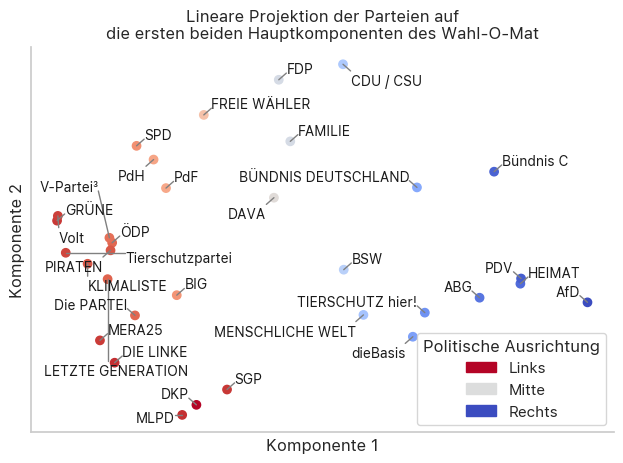

/var/folders/rc/yt1p624x707cdwbwc_7fchq40000gn/T/ipykernel_83412/945952929.py:14: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



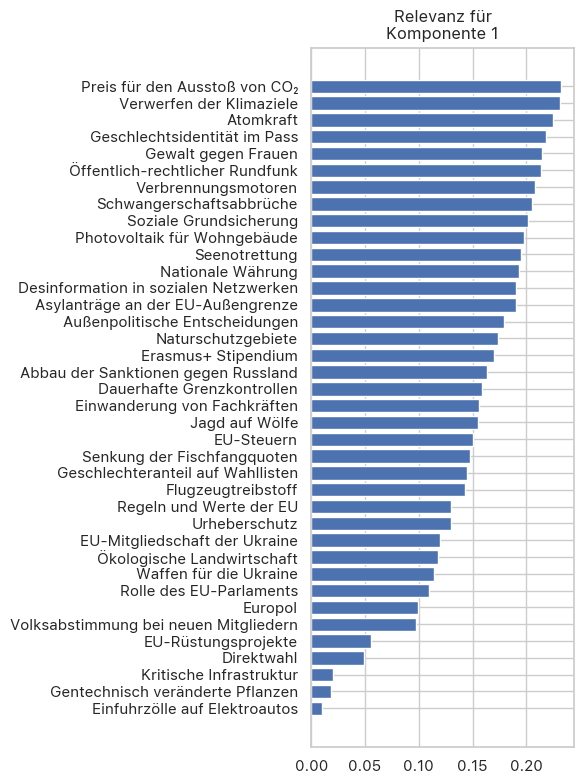

/var/folders/rc/yt1p624x707cdwbwc_7fchq40000gn/T/ipykernel_83412/945952929.py:14: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



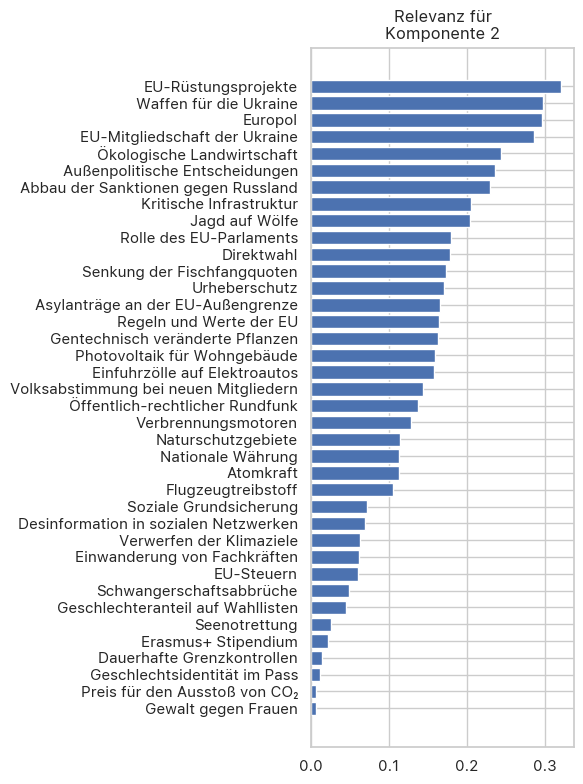

/var/folders/rc/yt1p624x707cdwbwc_7fchq40000gn/T/ipykernel_83412/945952929.py:14: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



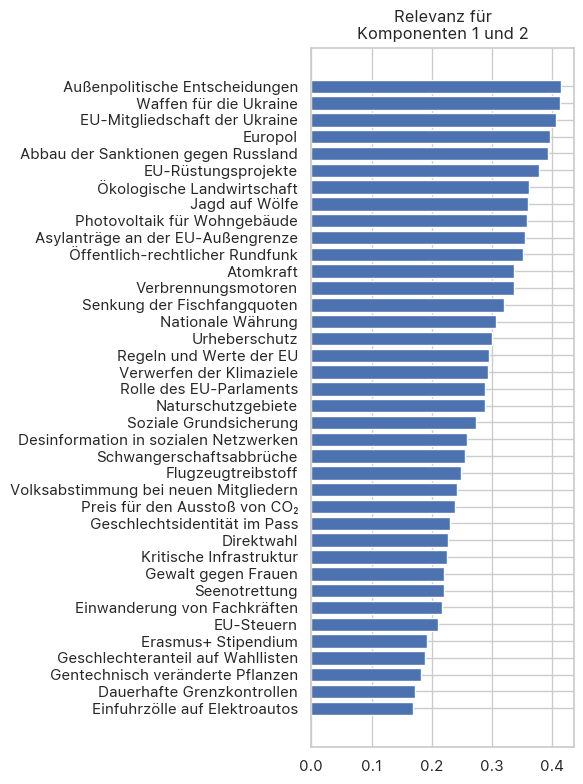

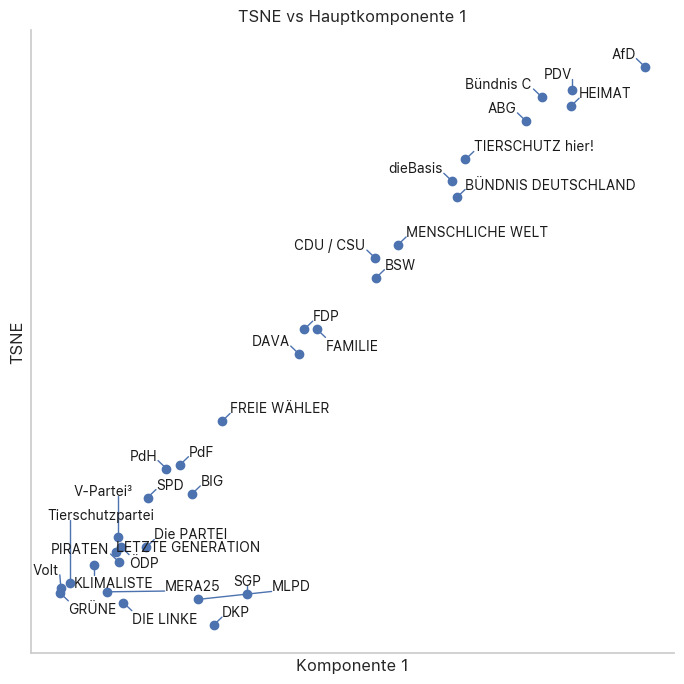

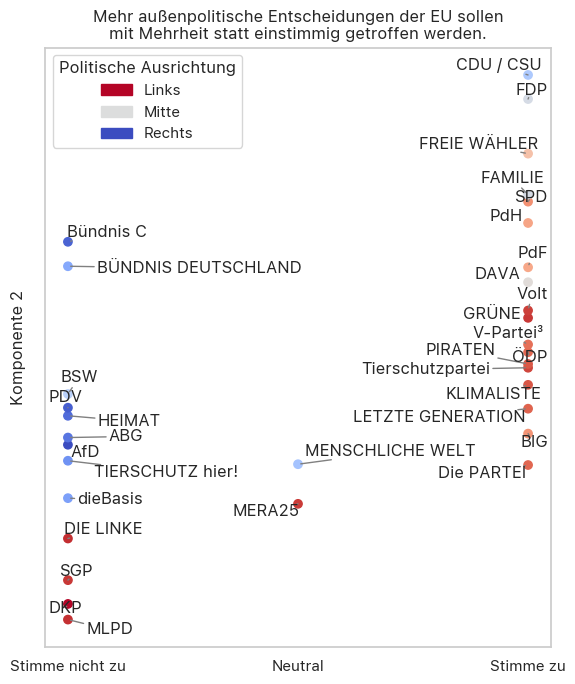

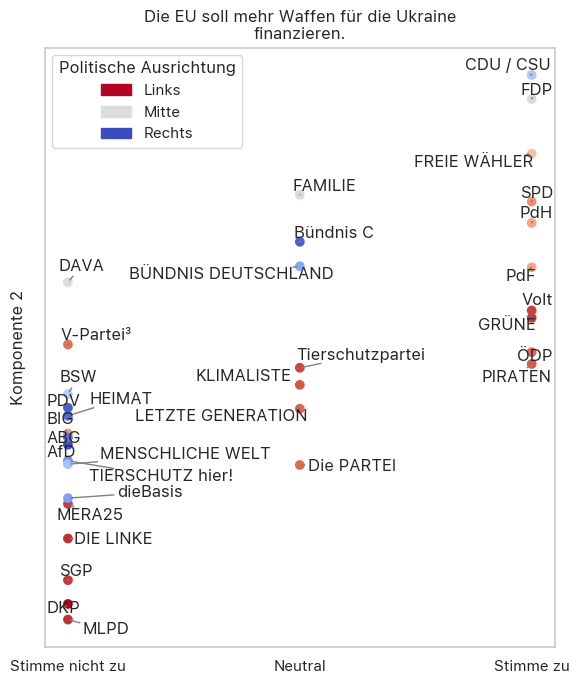

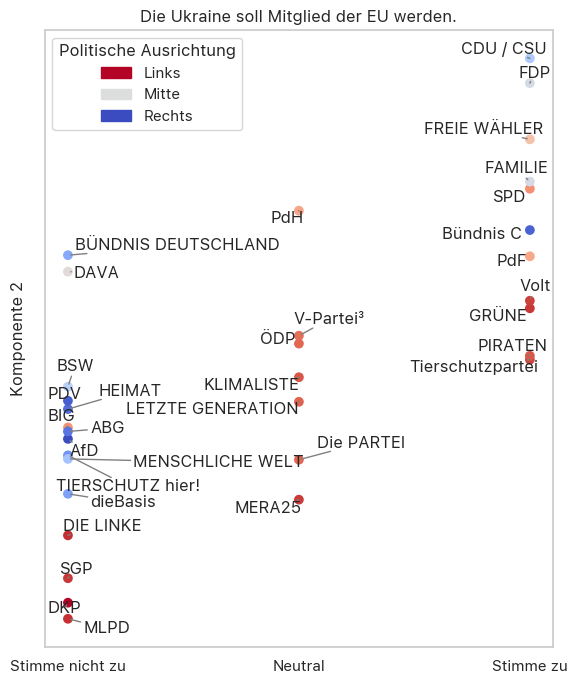

...

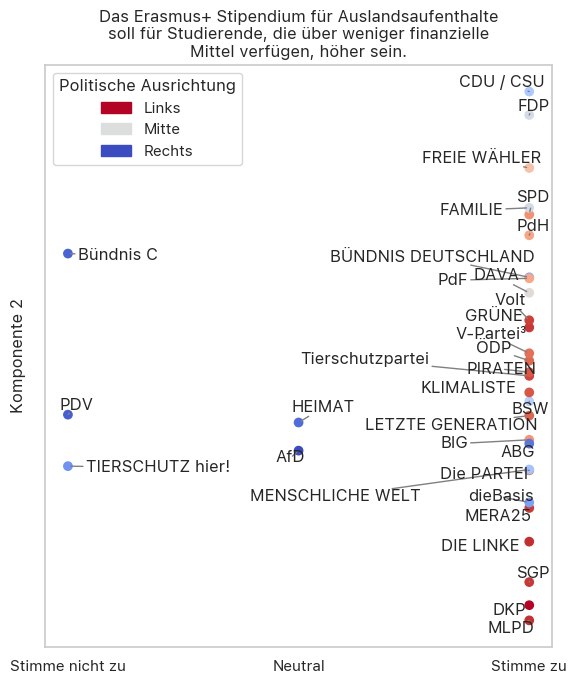

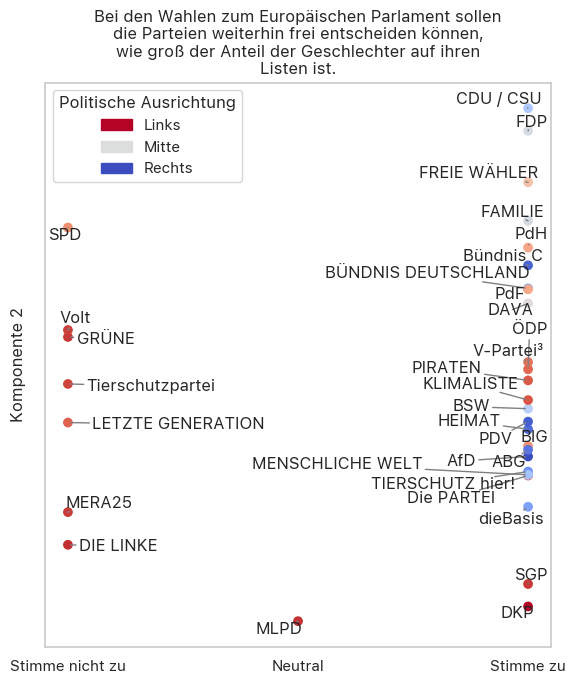

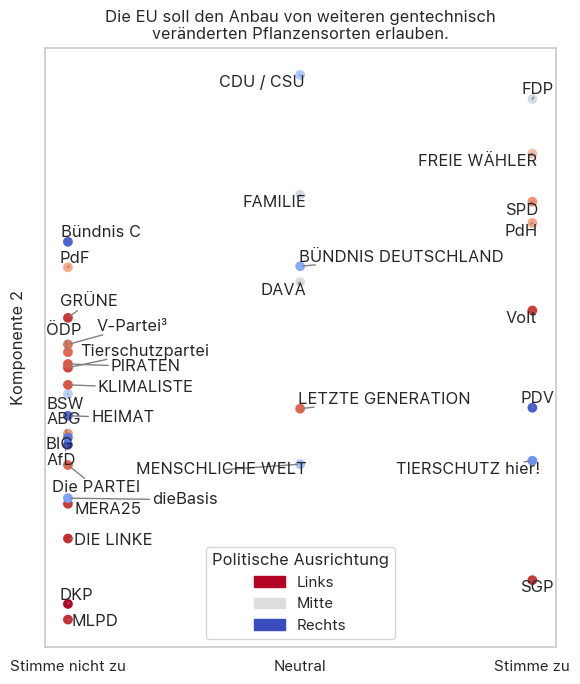

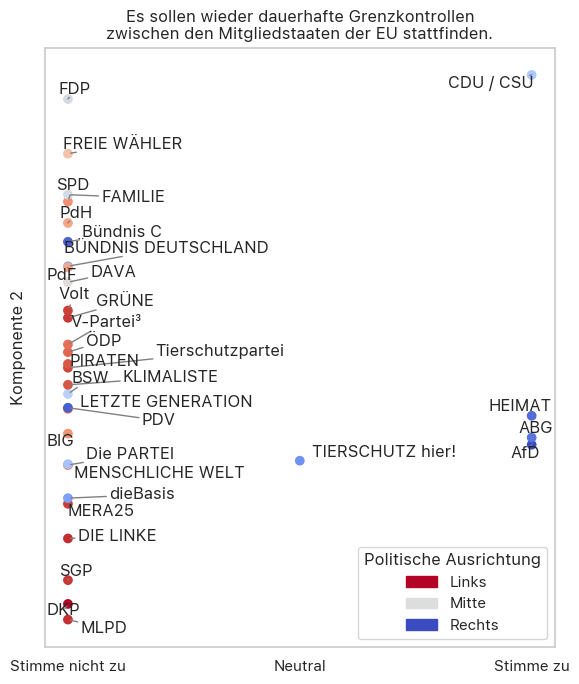

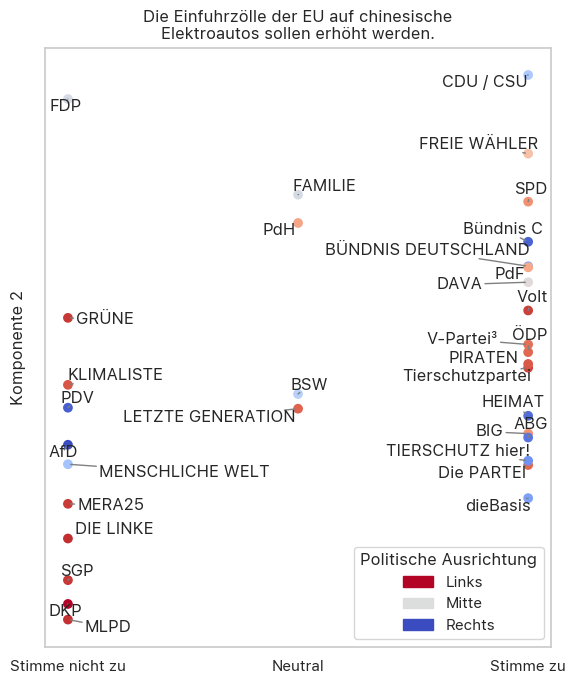

In [19]:
sorted_indices = np.argsort(np.abs(pca.components_[0]) + np.abs(pca.components_[1]))[::-1]

def pdf_fig(pdf, fig):
    pdf.savefig(fig)
    plt.show(fig)
    plt.close(fig)

with PdfPages('opinion_pca_2.pdf') as pdf:
    pdf_fig(pdf, plot_tsne2(opinion_tsne_2))
    pdf_fig(pdf, plot_opinion_2d(opinion_pca, opinion_tsne_1, party))
    pdf_fig(pdf, plot_relevance(pca, 0))
    pdf_fig(pdf, plot_relevance(pca, 1))
    pdf_fig(pdf, plot_relevance(pca, [0, 1]))
    pdf_fig(pdf, pca_vs_tsne(opinion_pca, opinion_tsne_1))
    
    fig_list = opinion_vs_spectrum(opinion[sorted_indices], opinion_pca[1], "Komponente 2", [], color=opinion_tsne_1["TSNE"])
    for fig in fig_list:
        pdf.savefig(fig)
        plt.close(fig)

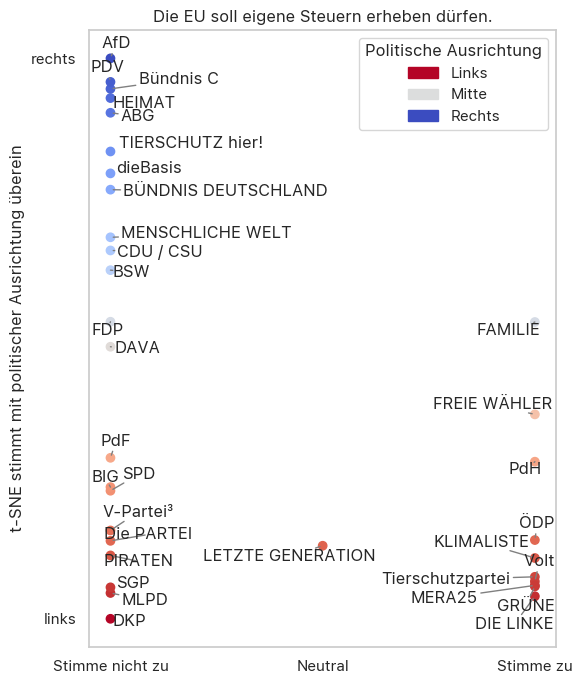

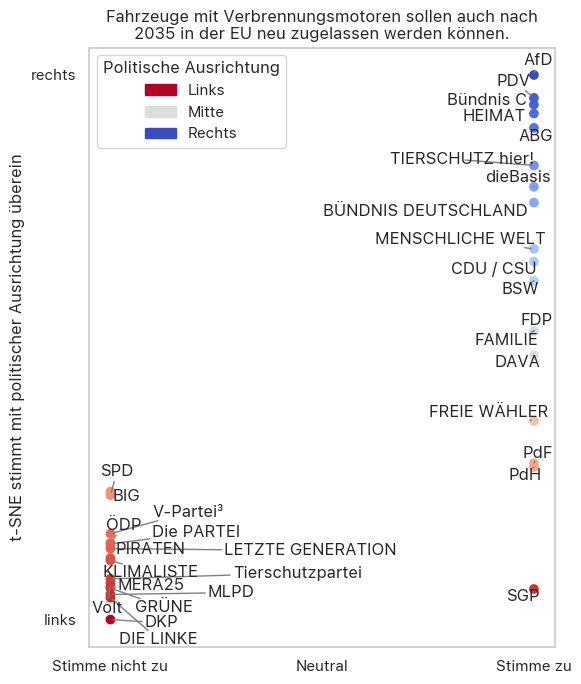

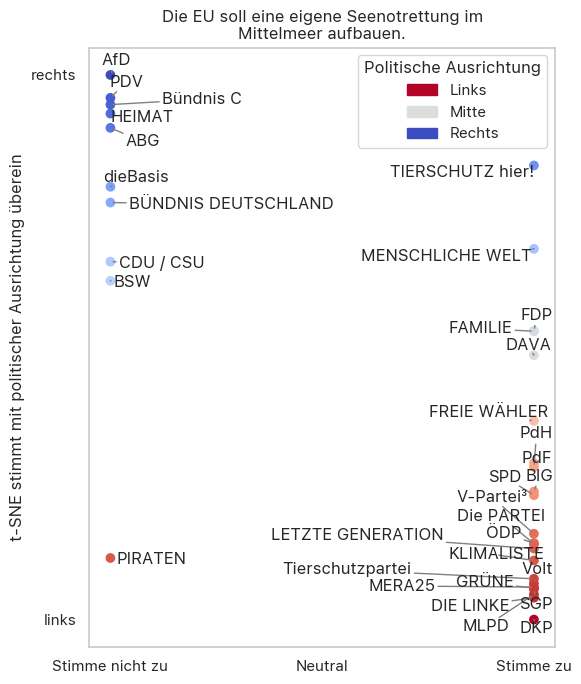

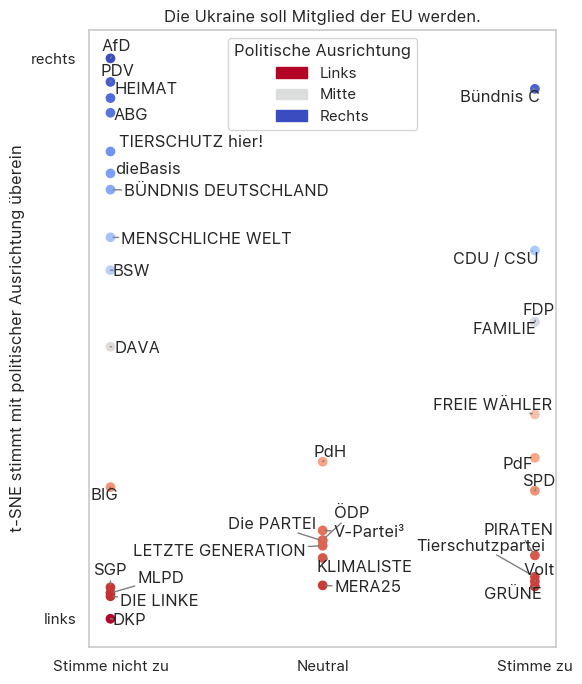

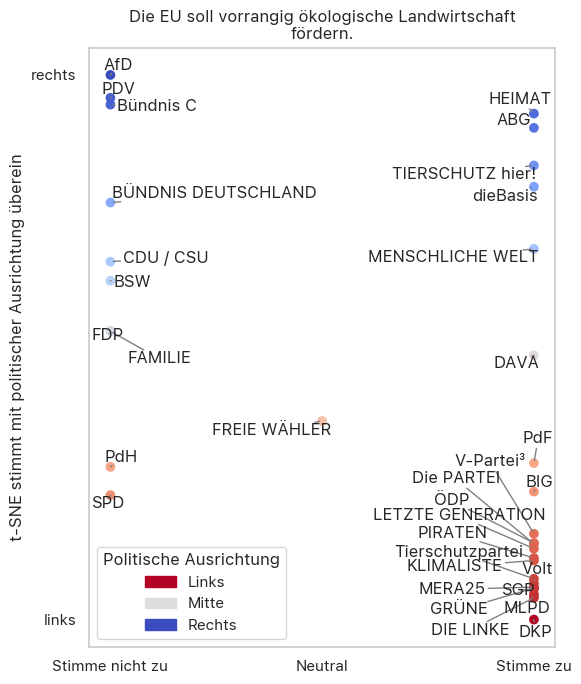

...

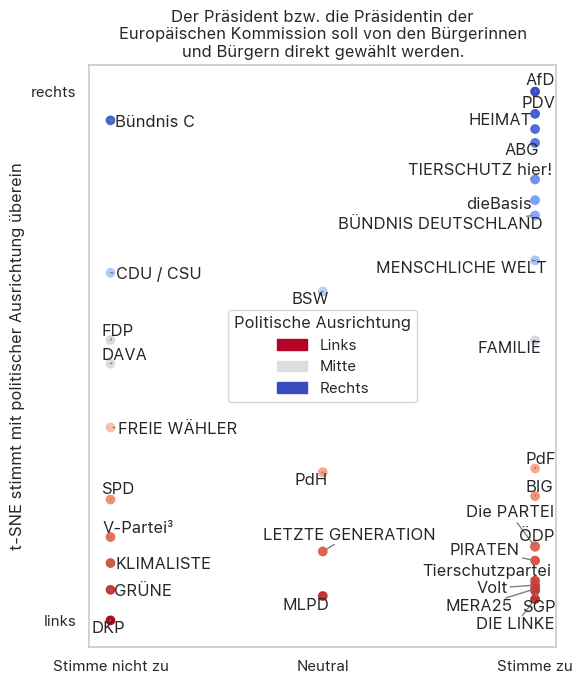

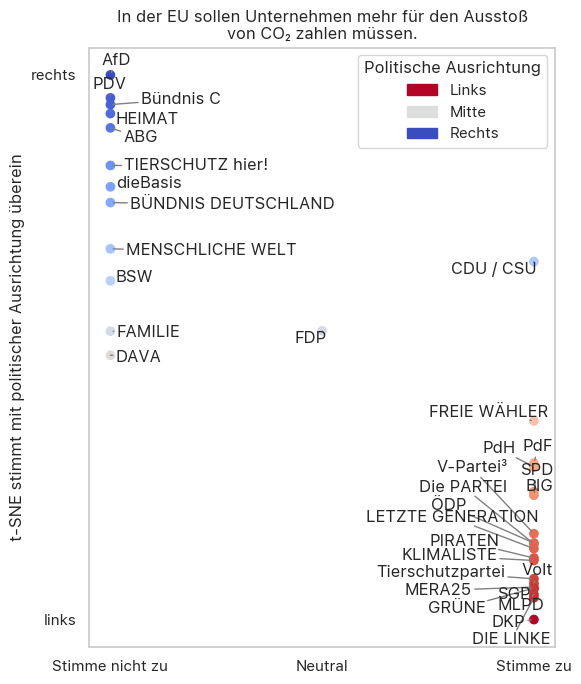

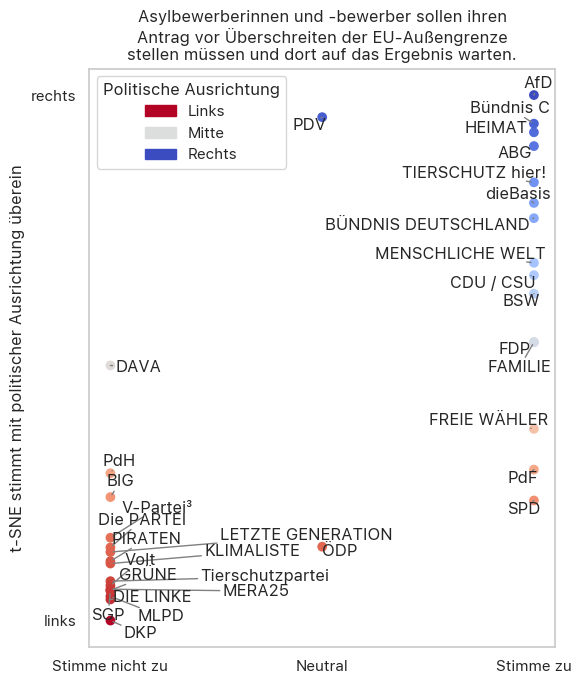

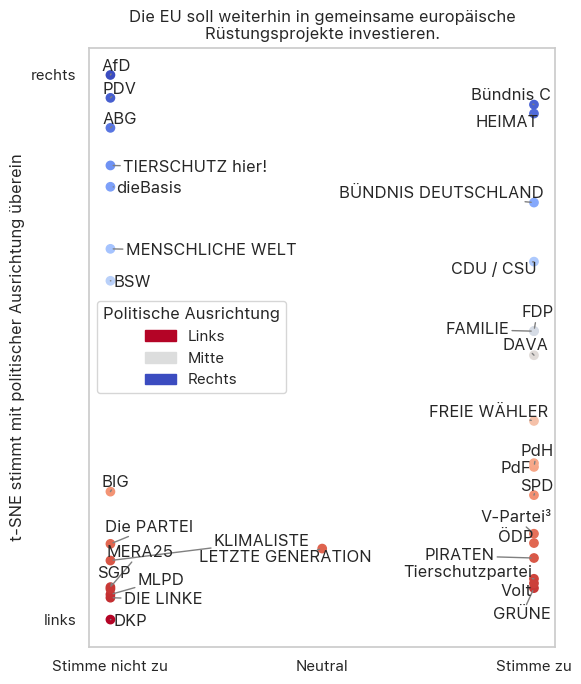

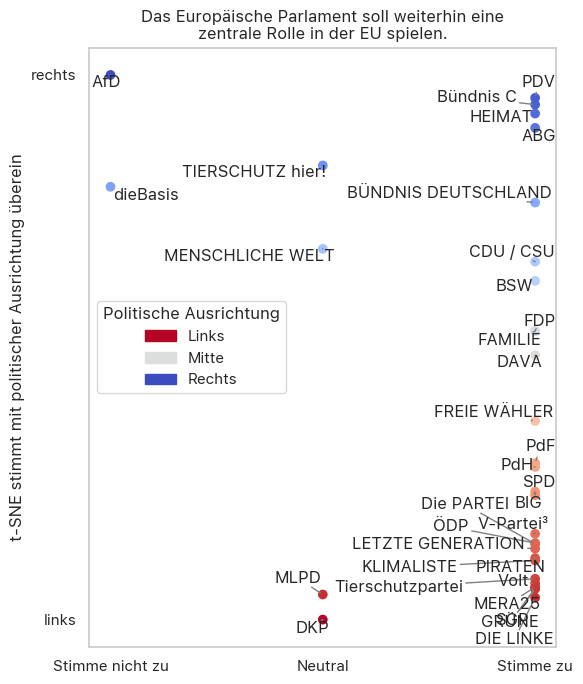

In [20]:
with PdfPages('opinion_left_right.pdf') as pdf:
    fig_list = opinion_vs_spectrum(opinion, opinion_tsne_1["TSNE"], "t-SNE stimmt mit politischer Ausrichtung überein", ["links", "rechts"], color=opinion_tsne_1["TSNE"])
    for fig in fig_list:
        pdf.savefig(fig)
        plt.close(fig)

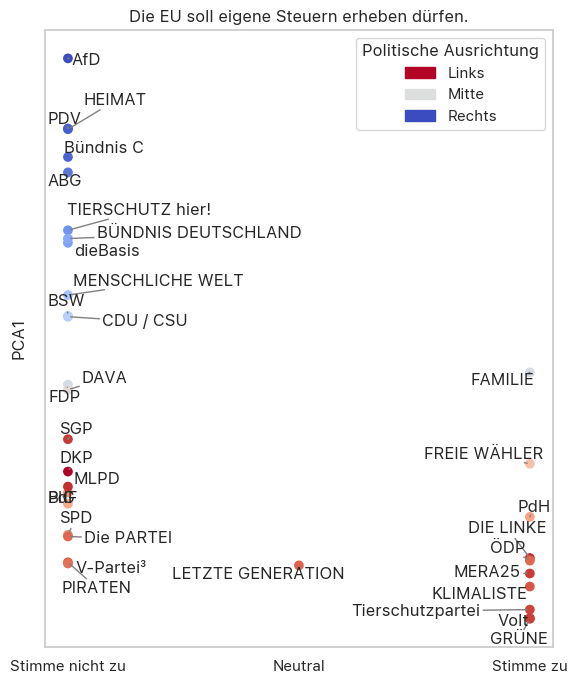

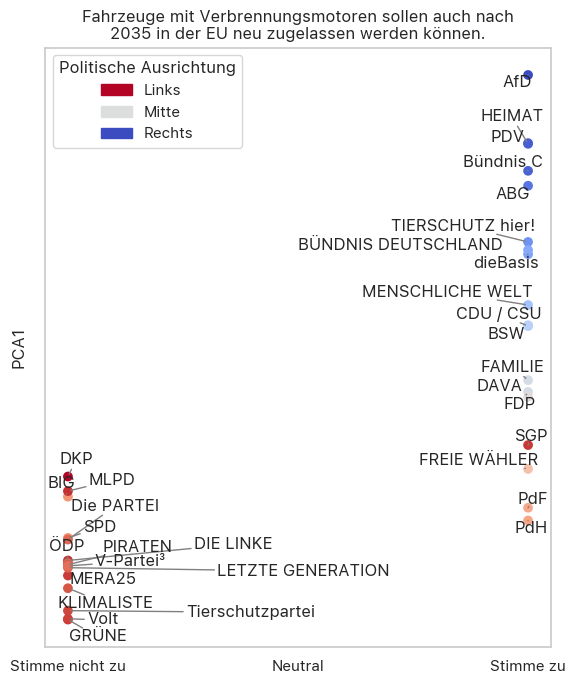

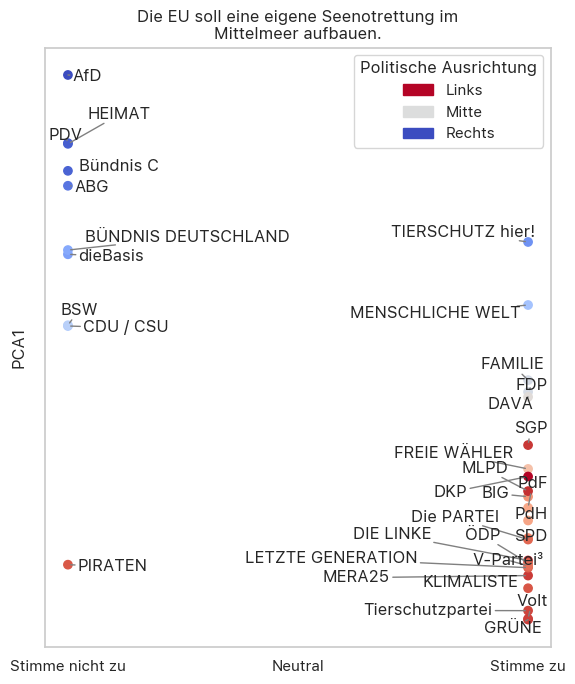

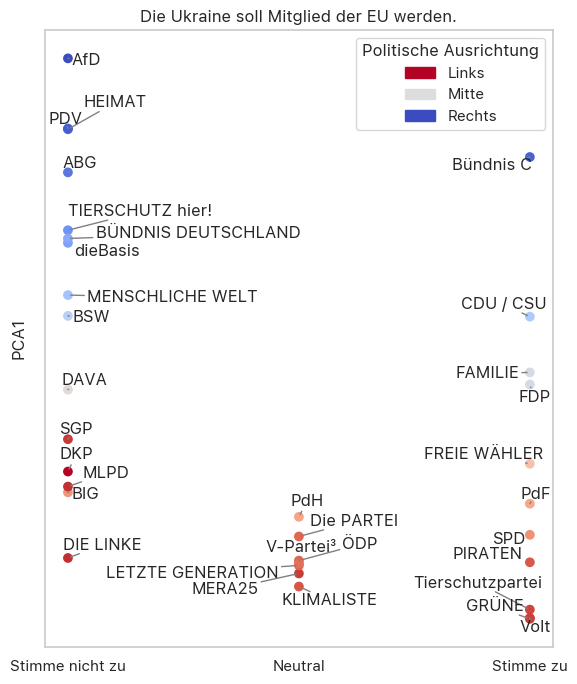

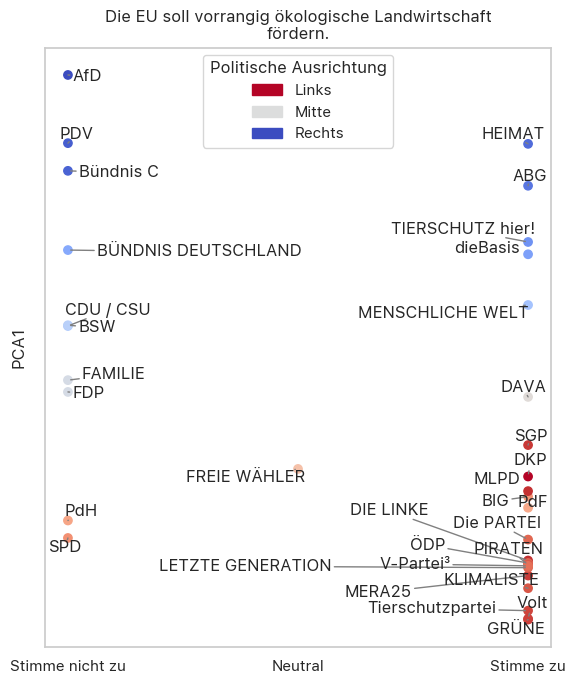

...

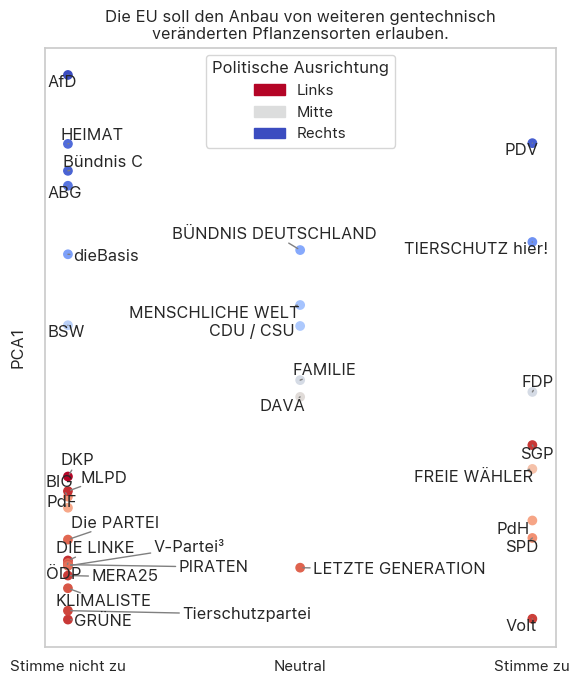

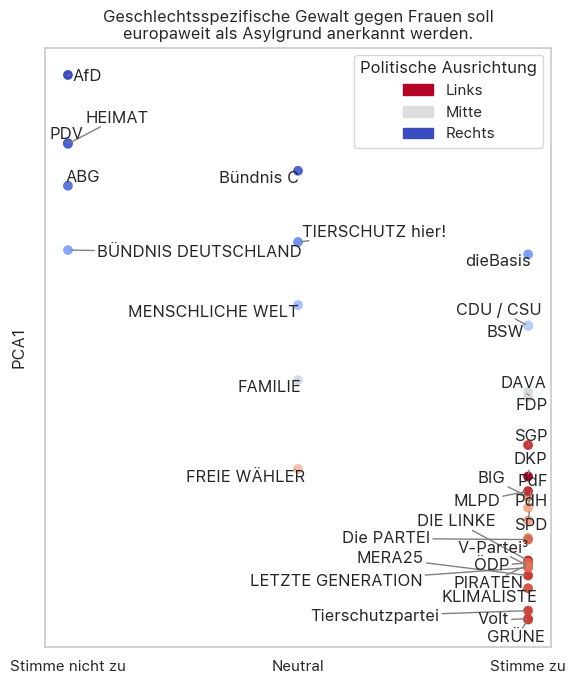

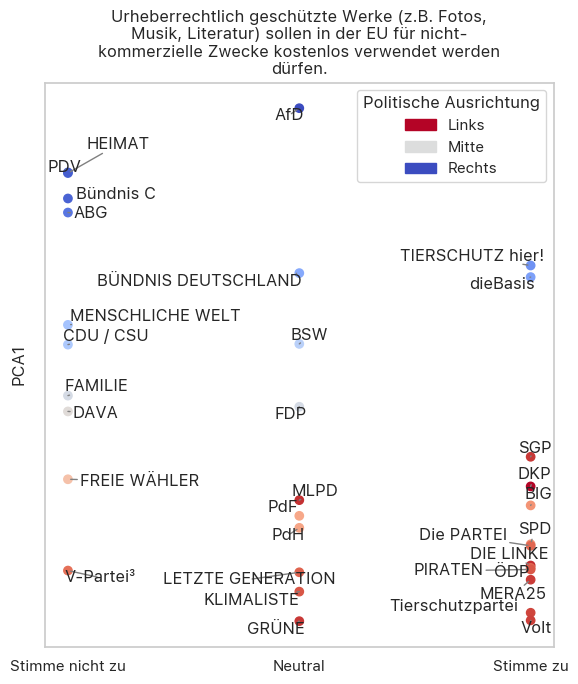

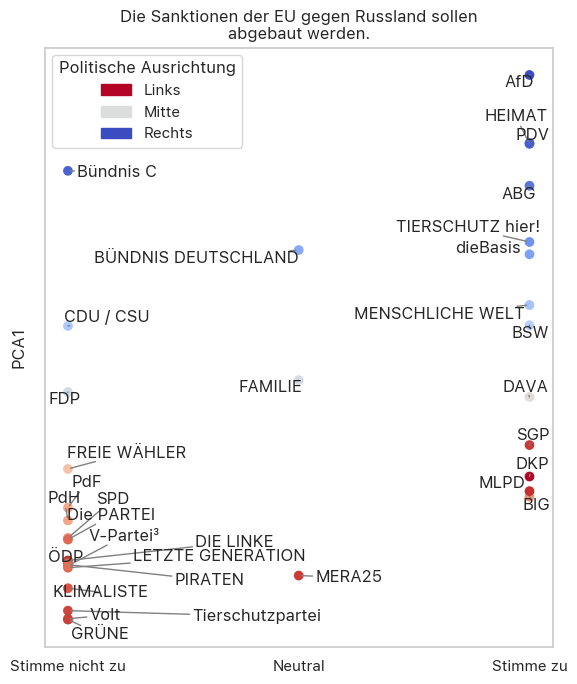

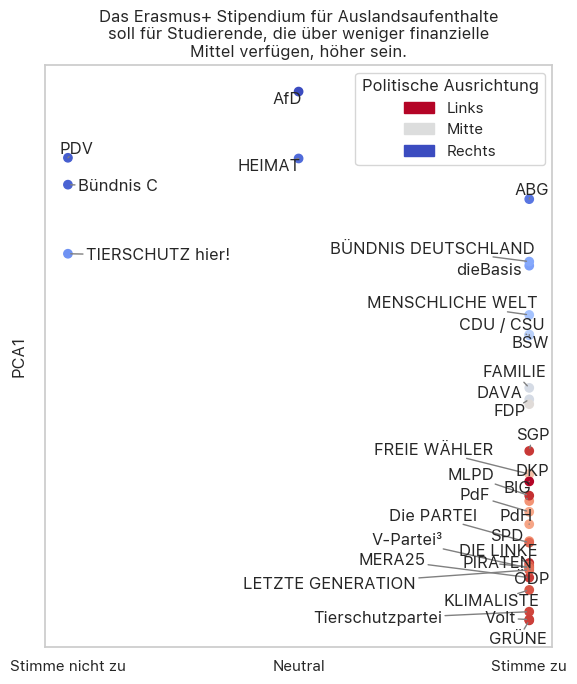

In [21]:
with PdfPages('opinion_pca_1.pdf') as pdf:
    fig_list = opinion_vs_spectrum(opinion, opinion_pca[0], "PCA1", [], color=opinion_tsne_1["TSNE"])
    for fig in fig_list:
        pdf.savefig(fig)
        plt.close(fig)